In [1]:
!nvidia-smi

Fri Oct 24 15:09:54 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Image URLs

In [2]:
cat_images = '''
            http://images.cocodataset.org/test-stuff2017/000000001043.jpg
            http://images.cocodataset.org/test-stuff2017/000000001600.jpg
            http://images.cocodataset.org/test-stuff2017/000000002945.jpg
            http://images.cocodataset.org/test-stuff2017/000000003257.jpg
            http://images.cocodataset.org/test-stuff2017/000000004540.jpg
            http://images.cocodataset.org/test-stuff2017/000000006581.jpg
            http://images.cocodataset.org/test-stuff2017/000000006598.jpg
            http://images.cocodataset.org/test-stuff2017/000000007188.jpg
            http://images.cocodataset.org/test-stuff2017/000000007362.jpg
            http://images.cocodataset.org/test-stuff2017/000000009966.jpg
            http://images.cocodataset.org/test-stuff2017/000000010198.jpg
            http://images.cocodataset.org/test-stuff2017/000000010699.jpg
            http://images.cocodataset.org/test-stuff2017/000000012218.jpg
            http://images.cocodataset.org/test-stuff2017/000000013048.jpg
            http://images.cocodataset.org/test-stuff2017/000000013693.jpg
            http://images.cocodataset.org/test-stuff2017/000000013782.jpg
            http://images.cocodataset.org/test-stuff2017/000000015387.jpg
            http://images.cocodataset.org/test-stuff2017/000000016265.jpg
            http://images.cocodataset.org/test-stuff2017/000000016387.jpg
            http://images.cocodataset.org/test-stuff2017/000000016656.jpg
            http://images.cocodataset.org/test-stuff2017/000000017337.jpg
            http://images.cocodataset.org/test-stuff2017/000000017391.jpg
            http://images.cocodataset.org/test-stuff2017/000000018985.jpg
            http://images.cocodataset.org/test-stuff2017/000000021633.jpg
            http://images.cocodataset.org/test-stuff2017/000000024258.jpg
            http://images.cocodataset.org/test-stuff2017/000000024301.jpg
            http://images.cocodataset.org/test-stuff2017/000000024668.jpg
            http://images.cocodataset.org/test-stuff2017/000000024837.jpg
            http://images.cocodataset.org/test-stuff2017/000000025334.jpg
            http://images.cocodataset.org/test-stuff2017/000000025629.jpg
            '''

In [3]:
cat_images_urls = cat_images.split('\n')
cat_images_urls = [i.strip() for i in cat_images_urls if len(i) > 0]
print(cat_images_urls)

['http://images.cocodataset.org/test-stuff2017/000000001043.jpg', 'http://images.cocodataset.org/test-stuff2017/000000001600.jpg', 'http://images.cocodataset.org/test-stuff2017/000000002945.jpg', 'http://images.cocodataset.org/test-stuff2017/000000003257.jpg', 'http://images.cocodataset.org/test-stuff2017/000000004540.jpg', 'http://images.cocodataset.org/test-stuff2017/000000006581.jpg', 'http://images.cocodataset.org/test-stuff2017/000000006598.jpg', 'http://images.cocodataset.org/test-stuff2017/000000007188.jpg', 'http://images.cocodataset.org/test-stuff2017/000000007362.jpg', 'http://images.cocodataset.org/test-stuff2017/000000009966.jpg', 'http://images.cocodataset.org/test-stuff2017/000000010198.jpg', 'http://images.cocodataset.org/test-stuff2017/000000010699.jpg', 'http://images.cocodataset.org/test-stuff2017/000000012218.jpg', 'http://images.cocodataset.org/test-stuff2017/000000013048.jpg', 'http://images.cocodataset.org/test-stuff2017/000000013693.jpg', 'http://images.cocodatas

In [4]:
person_images = '''
            http://images.cocodataset.org/test-stuff2017/000000000171.jpg
            http://images.cocodataset.org/test-stuff2017/000000000184.jpg
            http://images.cocodataset.org/test-stuff2017/000000000300.jpg
            http://images.cocodataset.org/test-stuff2017/000000000333.jpg
            http://images.cocodataset.org/test-stuff2017/000000000416.jpg
            http://images.cocodataset.org/test-stuff2017/000000000442.jpg
            http://images.cocodataset.org/test-stuff2017/000000000533.jpg
            http://images.cocodataset.org/test-stuff2017/000000000660.jpg
            http://images.cocodataset.org/test-stuff2017/000000000664.jpg
            http://images.cocodataset.org/test-stuff2017/000000000686.jpg
            http://images.cocodataset.org/test-stuff2017/000000000744.jpg
            http://images.cocodataset.org/test-stuff2017/000000000891.jpg
            http://images.cocodataset.org/test-stuff2017/000000001110.jpg
            http://images.cocodataset.org/test-stuff2017/000000001140.jpg
            http://images.cocodataset.org/test-stuff2017/000000001152.jpg
            http://images.cocodataset.org/test-stuff2017/000000001156.jpg
            http://images.cocodataset.org/test-stuff2017/000000001175.jpg
            http://images.cocodataset.org/test-stuff2017/000000001227.jpg
            http://images.cocodataset.org/test-stuff2017/000000001251.jpg
            http://images.cocodataset.org/test-stuff2017/000000001309.jpg
            http://images.cocodataset.org/test-stuff2017/000000001331.jpg
            http://images.cocodataset.org/test-stuff2017/000000001362.jpg
            http://images.cocodataset.org/test-stuff2017/000000001411.jpg
            http://images.cocodataset.org/test-stuff2017/000000001412.jpg
            http://images.cocodataset.org/test-stuff2017/000000001482.jpg
            http://images.cocodataset.org/test-stuff2017/000000001512.jpg
            http://images.cocodataset.org/test-stuff2017/000000001620.jpg
            http://images.cocodataset.org/test-stuff2017/000000001643.jpg
            http://images.cocodataset.org/test-stuff2017/000000001719.jpg
            http://images.cocodataset.org/test-stuff2017/000000001751.jpg
            '''

In [5]:
person_images_urls = person_images.split('\n')
person_images_urls = [i.strip() for i in person_images_urls if len(i) > 0]
print(person_images_urls)

['http://images.cocodataset.org/test-stuff2017/000000000171.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000184.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000300.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000333.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000416.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000442.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000533.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000660.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000664.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000686.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000744.jpg', 'http://images.cocodataset.org/test-stuff2017/000000000891.jpg', 'http://images.cocodataset.org/test-stuff2017/000000001110.jpg', 'http://images.cocodataset.org/test-stuff2017/000000001140.jpg', 'http://images.cocodataset.org/test-stuff2017/000000001152.jpg', 'http://images.cocodatas

# Caterogies in COCO-2017:

## cat - 8
## person - 15

### (these are the categories according to which FCN is operating)

In [6]:
cat_category = 8
person_category = 15

# Imports

In [7]:
from PIL import Image
import numpy as np
import requests
import matplotlib.pyplot as plt
import cv2

# Dice

In [8]:
def dice(image_1, image_2):
  '''returns the dice score between two binary images'''
  intersection = ((image_1 == 1) & (image_2 == 1)).sum()
  image_1_non_zero = (image_1 != 0).sum()
  image_2_non_zero = (image_2 != 0).sum()
  score = 2 * intersection / (image_1_non_zero + image_2_non_zero)
  return score

# Setup and Sample Prediction for FCN

In [9]:
# https://docs.pytorch.org/vision/main/models.html

from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights

# Model initialization

weights = FCN_ResNet50_Weights.DEFAULT
fcn_model = fcn_resnet50(weights=weights)
fcn_model.eval()

# Preprocessor

fcn_preprocess = weights.transforms()

torch.Size([1, 21, 520, 693])


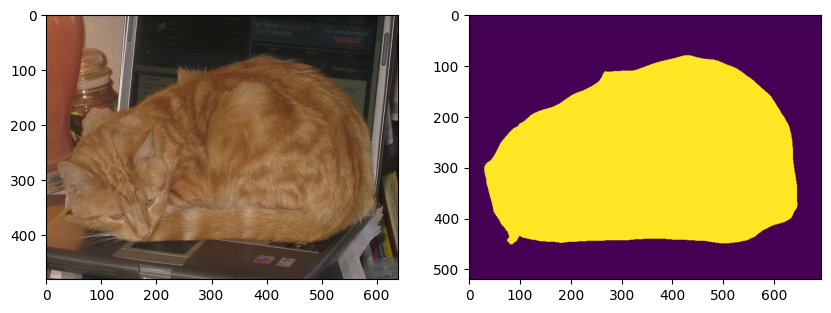

In [10]:
# Load image

image_url = cat_images_urls[0]

image = Image.open(requests.get(image_url, stream=True).raw).convert("RGB")
image_np = np.array(image)

# Preprocess image

image = fcn_preprocess(image)

# Prediction (model returns a dictionary, relevant key is 'out')

prediction = fcn_model(image.unsqueeze(0))["out"]
print(prediction.shape)
predicted_mask = prediction[0].argmax(0)
predicted_mask = predicted_mask.detach().cpu().numpy()

fcn_cat_prediction = predicted_mask == cat_category

# Display

plt.figure(figsize = (10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_np)
plt.subplot(1, 2, 2)
plt.imshow(fcn_cat_prediction)


# Setup and Sample Prediction for CLIPSeg

In [11]:
# https://huggingface.co/docs/transformers/en/model_doc/clipseg

import torch
from transformers import AutoProcessor, CLIPSegForImageSegmentation
from transformers.image_utils import load_image

# Model initialization

clip_seg_model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

# Preprocessor

clip_seg_processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


/usr/local/lib/python3.12/dist-packages/transformers/image_processing_utils.py:51: UserWarning: The following named arguments are not valid for `ViTImageProcessor.preprocess` and were ignored: 'padding'
  return self.preprocess(images, **kwargs)


torch.Size([1, 352, 352])


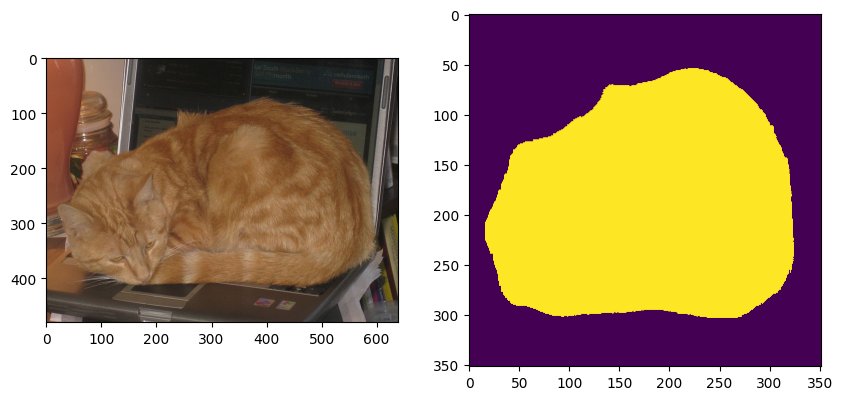

In [12]:
# Load image

image_url = cat_images_urls[0]

image = load_image(image_url)
image_np = np.array(image)

# Preprocess image

text_prompts = ["a cat"]
image = clip_seg_processor(text=text_prompts, images=[image] * len(text_prompts), padding=True, return_tensors="pt")

# Prediction

with torch.inference_mode():
    output = clip_seg_model(**image)

prediction = output.logits
print(prediction.shape)

predicted_mask = prediction[0] > 0.5
clipseg_cat_prediction = predicted_mask.detach().cpu().numpy()

# Display

plt.figure(figsize = (10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_np)
plt.subplot(1, 2, 2)
plt.imshow(clipseg_cat_prediction)

# Displaying Together and Computing Similarity in Predictions

0.985


Text(0.5, 0.98, 'Dice btw FCN and CLIPSeg: 0.985')

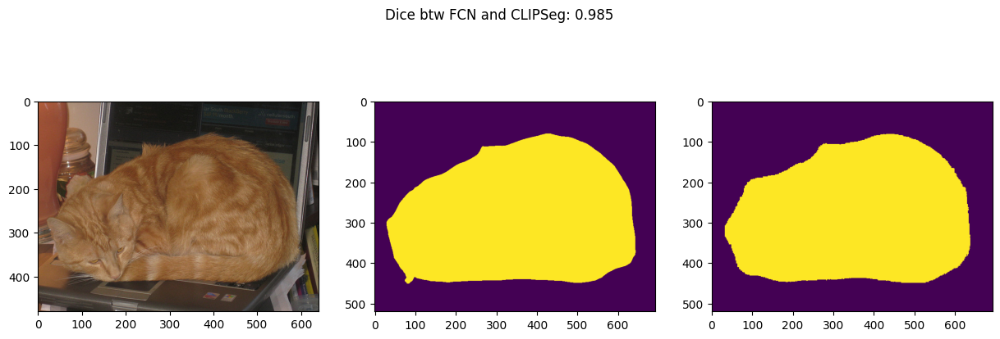

In [13]:
# Resize clipseg_prediction

clipseg_cat_prediction_resized = cv2.resize(np.uint8(clipseg_cat_prediction), (fcn_cat_prediction.shape[1], fcn_cat_prediction.shape[0]), interpolation = cv2.INTER_NEAREST)

# Compute Dice

dice_fcn_clipseg = dice(fcn_cat_prediction, clipseg_cat_prediction_resized)
dice_fcn_clipseg = round(dice_fcn_clipseg, 3)
print(dice_fcn_clipseg)

# Display

plt.figure(figsize = (15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image_np)
plt.subplot(1, 3, 2)
plt.imshow(fcn_cat_prediction)
plt.subplot(1, 3, 3)
plt.imshow(clipseg_cat_prediction_resized)
plt.suptitle(f'Dice btw FCN and CLIPSeg: {dice_fcn_clipseg}')

# Compare predictions for the remaining images both qualitatively (visualize) as well as quantitatively (compute similarity between predictions using dice)

In [15]:
def loadandpredict(i):
  ###### FCN #####
  # Load image
  image_url = cat_images_urls[i]

  image = Image.open(requests.get(image_url, stream=True).raw).convert("RGB")
  image_np = np.array(image)

  # Preprocess image
  image = fcn_preprocess(image)

  # Prediction (model returns a dictionary, relevant key is 'out')
  prediction = fcn_model(image.unsqueeze(0))["out"]
  # print(prediction.shape)
  predicted_mask = prediction[0].argmax(0)
  predicted_mask = predicted_mask.detach().cpu().numpy()

  fcn_cat_prediction = predicted_mask == cat_category


  ##### Clip ######
  # Load image
  image_url = cat_images_urls[i]

  image = load_image(image_url)
  image_np = np.array(image)

  # Preprocess image
  text_prompts = ["a cat"]
  image = clip_seg_processor(text=text_prompts, images=[image] * len(text_prompts), padding=True, return_tensors="pt")

  # Prediction
  with torch.inference_mode():
      output = clip_seg_model(**image)

  prediction = output.logits
  # print(prediction.shape)
  predicted_mask = prediction[0] > 0.5
  clipseg_cat_prediction = predicted_mask.detach().cpu().numpy()

  return fcn_cat_prediction, clipseg_cat_prediction, image_np



def DisplayTogether(fcn_cat_prediction, clipseg_cat_prediction, image_np):
  # Resize clipseg_prediction
  clipseg_cat_prediction_resized = cv2.resize(np.uint8(clipseg_cat_prediction), (fcn_cat_prediction.shape[1], fcn_cat_prediction.shape[0]), interpolation = cv2.INTER_NEAREST)

  # Compute Dice
  dice_fcn_clipseg = dice(fcn_cat_prediction, clipseg_cat_prediction_resized)
  dice_fcn_clipseg = round(dice_fcn_clipseg, 3)
  # print(dice_fcn_clipseg)

  # # Display
  # plt.figure(figsize = (15, 5))
  # plt.subplot(1, 3, 1)
  # plt.imshow(image_np)
  # plt.subplot(1, 3, 2)
  # plt.imshow(fcn_cat_prediction)
  # plt.subplot(1, 3, 3)
  # plt.imshow(clipseg_cat_prediction_resized)
  # plt.suptitle(f'Dice btw FCN and CLIPSeg: {dice_fcn_clipseg}')

  # # Display
  plt.figure(figsize=(15, 5))

  # Ajustando o espaçamento entre as imagens
  plt.subplot(1, 3, 1)
  plt.imshow(image_np)
  plt.axis('off')  # Remover os eixos para uma exibição mais limpa
  plt.subplot(1, 3, 2)
  plt.imshow(fcn_cat_prediction)
  plt.axis('off')  # Remover os eixos
  plt.subplot(1, 3, 3)
  plt.imshow(clipseg_cat_prediction_resized)
  plt.axis('off')  # Remover os eixos

  # Ajustando o título para que as imagens fiquem mais próximas
  plt.suptitle(f'Dice: {dice_fcn_clipseg}', fontsize=10)
  plt.subplots_adjust(top=0.85, bottom=0.1, left=0.05, right=0.95, hspace=0.3)  # Reduzindo o espaço entre as imagens

  return dice_fcn_clipseg

/tmp/ipython-input-3088087901.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


MissingSchema: Invalid URL '': No scheme supplied. Perhaps you meant https://?

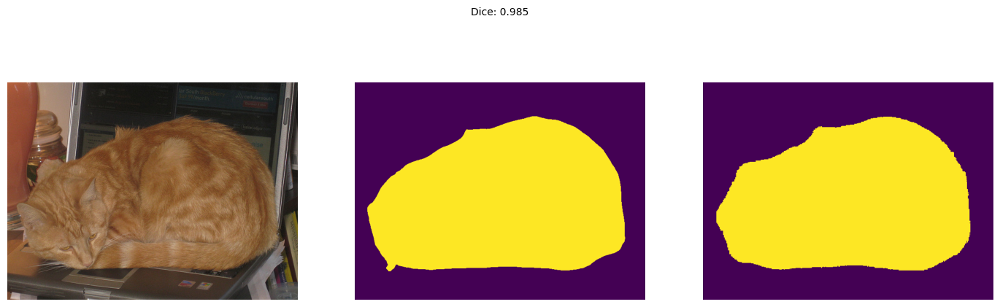

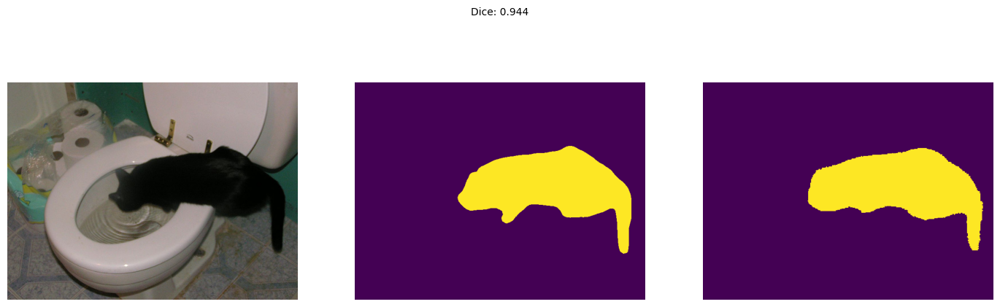

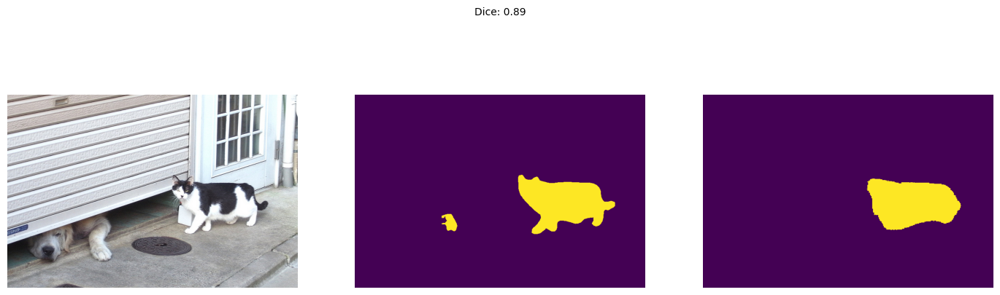

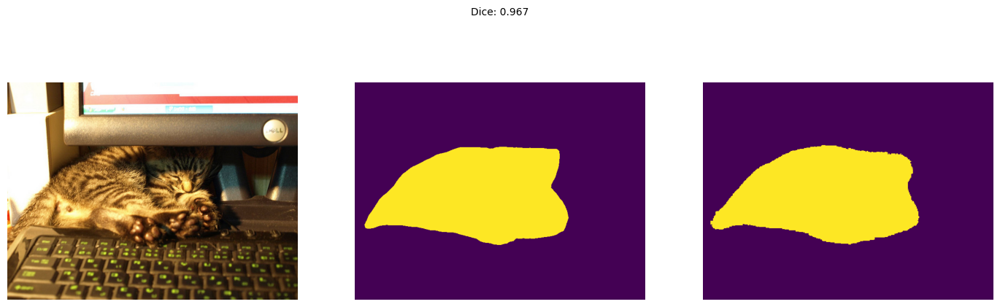

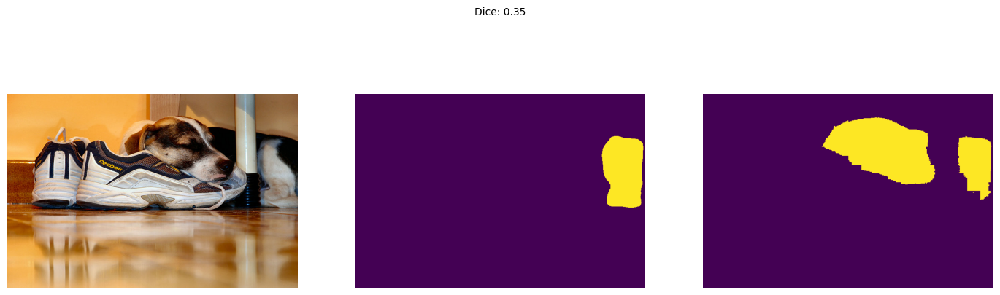

...

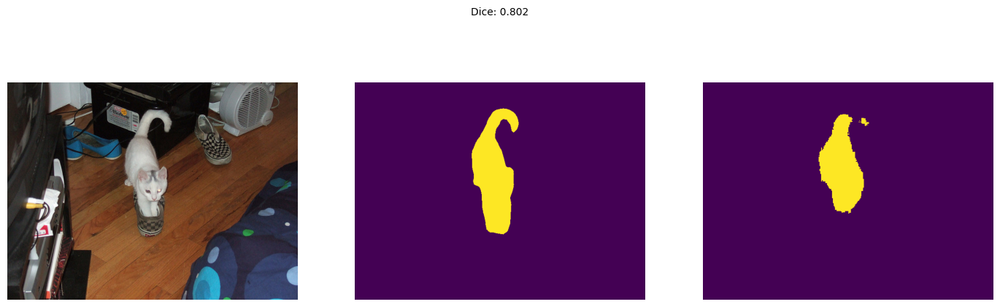

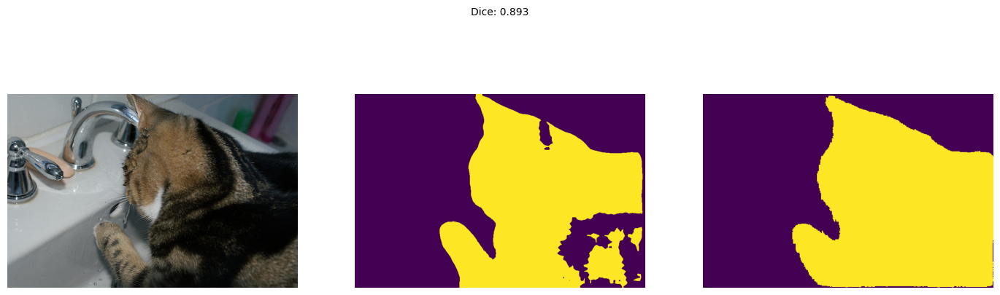

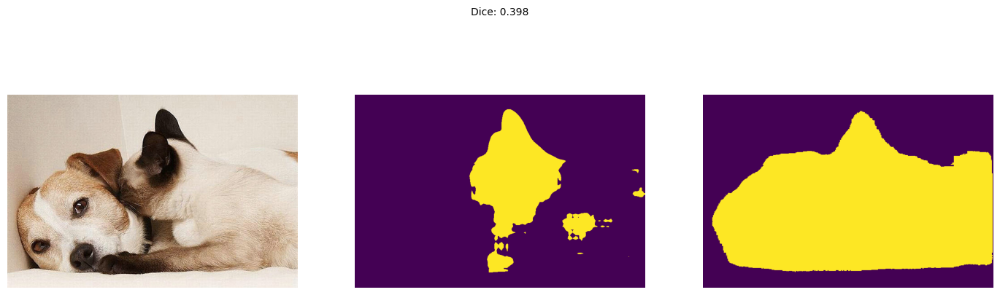

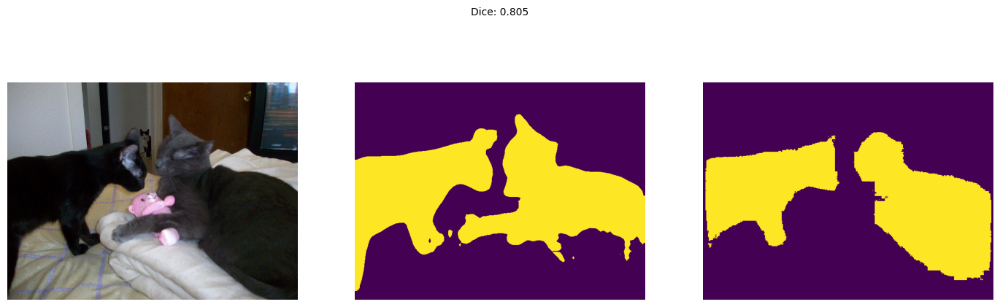

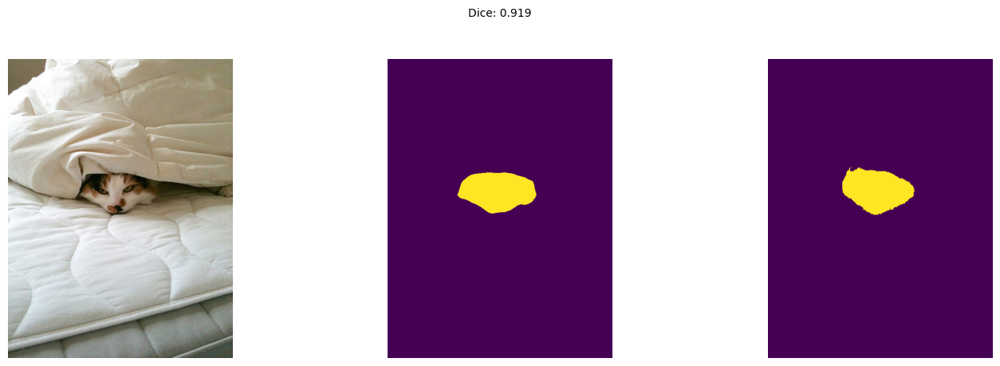

In [16]:
dicelist = []

for i in range(len(cat_images_urls)):
  fcn_cat_prediction, clipseg_cat_prediction, image_np = loadandpredict(i)
  dice_score = DisplayTogether(fcn_cat_prediction, clipseg_cat_prediction, image_np)
  dicelist.append(dice_score)

Average Dice: 0.856
Std: 0.170


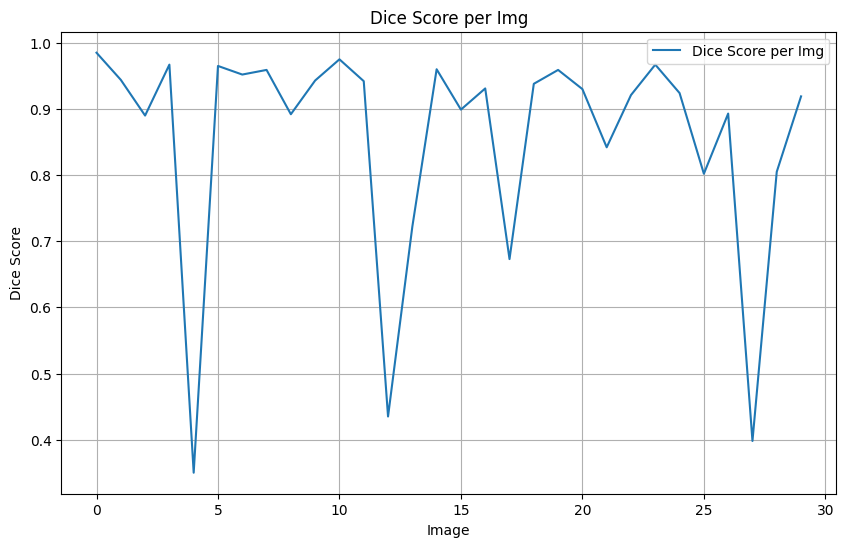

In [17]:
mean_dice = np.mean(dicelist)
std_dice = np.std(dicelist)

print(f"Average Dice: {mean_dice:.3f}")
print(f"Std: {std_dice:.3f}")

plt.figure(figsize=(10, 6))
plt.plot(dicelist, label='Dice Score per Img')
plt.xlabel('Image')
plt.ylabel('Dice Score')
plt.title('Dice Score per Img')
plt.legend()
plt.grid(True)
plt.show()